## This notebook basically covers three parts based on the chest X-ray datasets:
* Exploratory data analysis
* Feature extraction
* Feed extracted features into SVM for classification

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import cv2
from glob import glob
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
image_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png")
mask_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/masks")
reading_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings")

# Any results you write to the current directory are saved as output.

## Part 1: Exploratory data analysis
### Extract patients information

There are 800 chest x-ray images and 704 masks.

In [2]:
images = os.listdir(image_path)
masks = os.listdir(mask_path)
readings = os.listdir(reading_path)
print('Total number of x-ray images:',len(images))
print('Total number of masks:',len(masks))
print('Total number of clinical readings:',len(readings))

Total number of x-ray images: 800
Total number of masks: 704
Total number of clinical readings: 800


Out of the 800 x-ray images, 394 are tuberculosis positive and 406 are negative.

In [3]:
tb_positive = [image for image in images if image.split('.png')[0][-1]=='1']
tb_negative = [image for image in images if image.split('.png')[0][-1]=='0']
print('There are %d tuberculosis positive cases.' % len(tb_positive))
print('There are %d tuberculosis negative cases.' % len(tb_negative))

There are 394 tuberculosis positive cases.
There are 406 tuberculosis negative cases.


Below shows one TB positive image and one TB negative image. 

Image CHNCXR_0351_1.png is positive on tuberculosis.


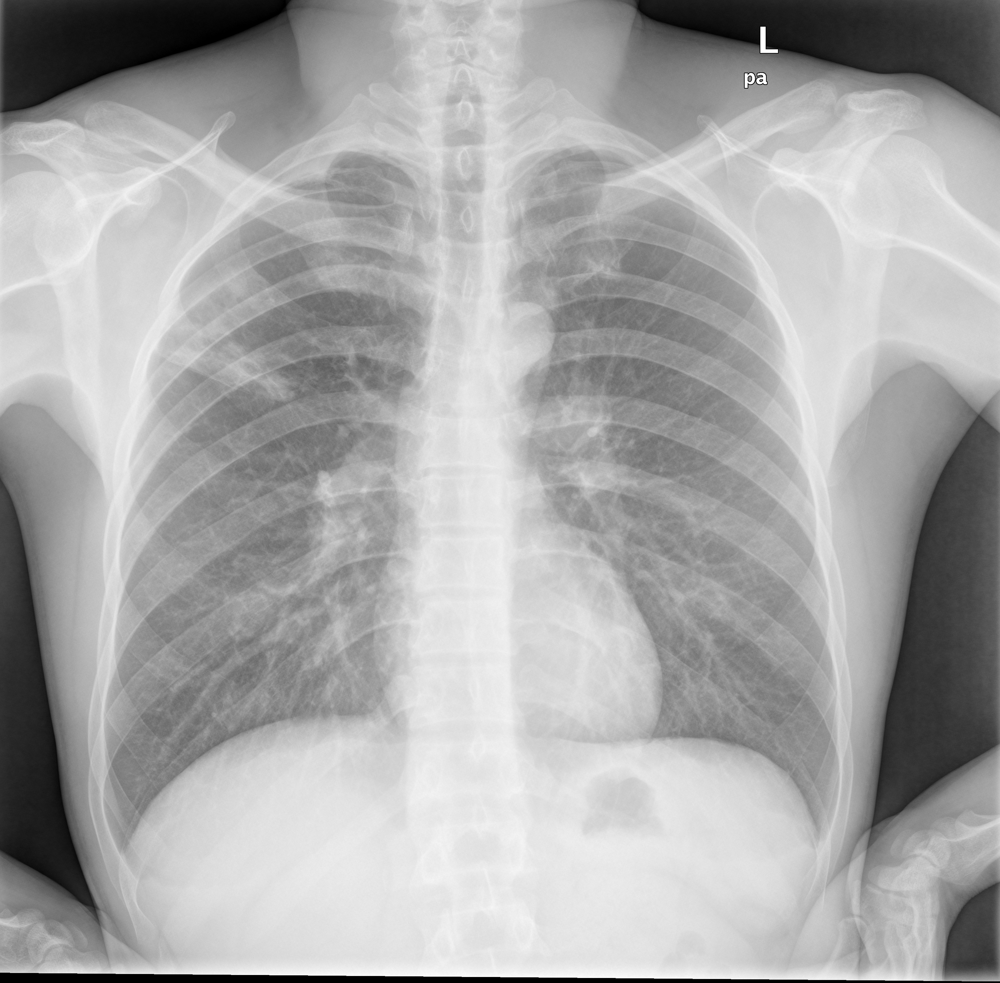

Image MCUCXR_0084_0.png is negative on tuberculosis.


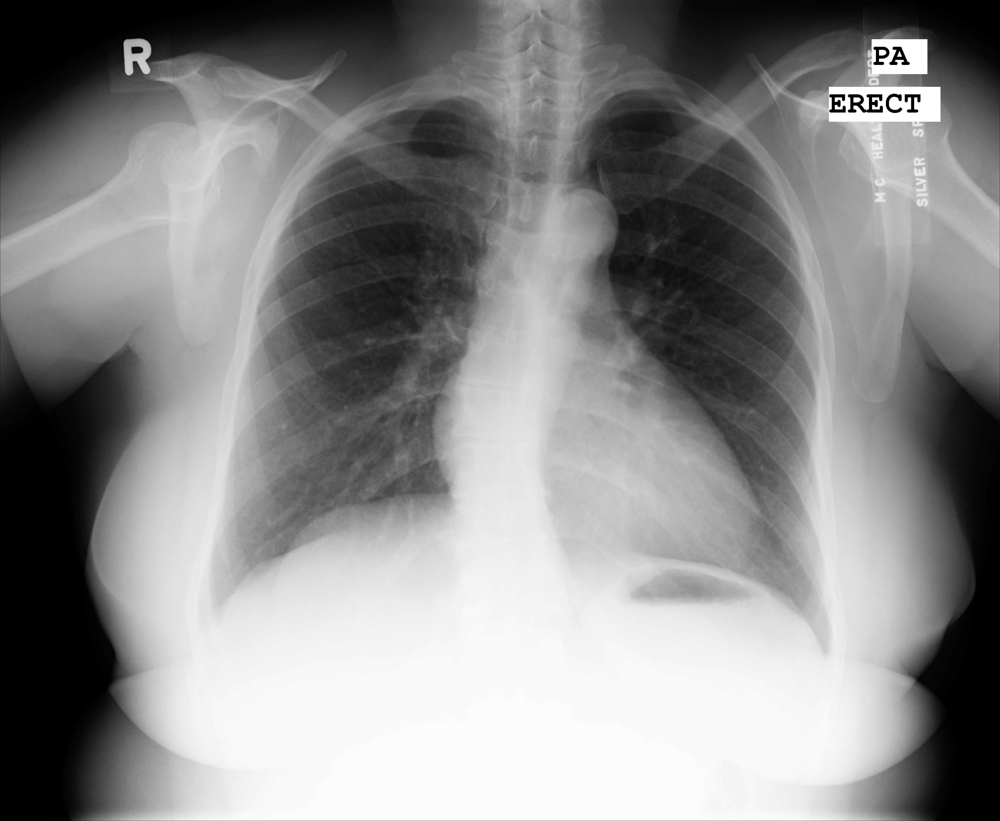

In [4]:
from IPython.display import Image
pos_image = np.random.choice(tb_positive,1)
neg_image = np.random.choice(tb_negative,1)
print("Image %s is positive on tuberculosis." % pos_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png",pos_image[0]),width=256,height=256))
print("Image %s is negative on tuberculosis." % neg_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png",neg_image[0]),width=256,height=256))

Now we consolidate all patients' information into a dataframe.

In [5]:
tb_state = [int(image.split('.png')[0][-1]) for image in images]
img_df = pd.DataFrame({'Image_name':images, 'TB_state': tb_state})
img_df['Path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png/"+x)
img_df['Source'] = img_df['Image_name'].map(lambda x: x.split('_')[0])
img_df['Text_path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/"+x.split('.png')[0]+'.txt')
img_df.head()

,Image_name,TB_state,Path,Source,Text_path
0,CHNCXR_0428_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
1,CHNCXR_0173_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
2,MCUCXR_0071_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,MCUCXR,../input/chest-xray-masks-and-labels/data/Lung...
3,CHNCXR_0442_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
4,CHNCXR_0638_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...


In [6]:
ages=[]
genders=[]
descriptions=[]
for txt in img_df.Text_path.tolist():
    lines = [line for line in open(txt,'r')]
    if "Patient's Sex:" in lines[0]:
        gender = lines[0][lines[0].index("Patient's Sex:")+len("Patient's Sex:")+1]
        genders.append(gender)
        start = lines[1].index("Patient's Age:")
        length = len("Patient's Age:")
        age = int(lines[1][start+length+2:start+length+4])
        ages.append(age)
        description = ' '.join(lines[2:]).strip()
        descriptions.append(description)
    else:
        if "male" or "MALE" in lines[0]:
            gender = 'M'
            genders.append(gender)
        else:
            gender = 'F'
            genders.append(gender)
        if "yrs" in lines[0]:
            start = lines[0].index("yrs")
            age = int(lines[0][start-2:start])
            ages.append(age)
        elif "yr" in lines[0]:
            start = lines[0].index("yr")
            age = int(lines[0][start-2:start])
            ages.append(age)
        else:
            ages.append(np.NaN)
        description = ' '.join(lines[1:]).strip()
        descriptions.append(description)
            
img_df['Age'] = ages
img_df['Gender'] = genders
img_df['Description'] = descriptions
img_df.head()

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
0,CHNCXR_0428_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,39.0,M,secondary PTB in the right upper field
1,CHNCXR_0173_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,28.0,M,normal
2,MCUCXR_0071_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,MCUCXR,../input/chest-xray-masks-and-labels/data/Lung...,33.0,F,normal
3,CHNCXR_0442_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,27.0,M,right upper PTB
4,CHNCXR_0638_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,36.0,M,Bilateral secondary PTB with left lower field ...


As mentioned earlier, the proportion of TB positive cases is around 50%, out of all the x-ray images.

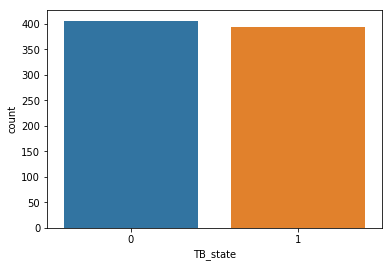

In [7]:
sns.countplot(x='TB_state', data=img_df)

Out of the 800 images, 662 are from Shenzhen and 138 are from Montgomery.

In [8]:
img_df.groupby(by='Source')['Image_name'].count()

Source
CHNCXR    662
MCUCXR    138
Name: Image_name, dtype: int64

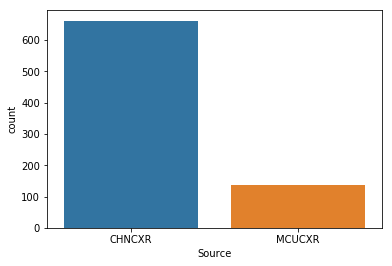

In [9]:
sns.countplot(x='Source', data=img_df)

We have more male patients, and the TB positive rate is also higher for male patients (51.4%) compared with female (28.4%).

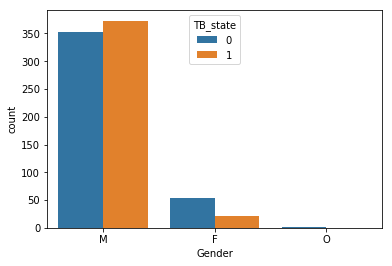

In [10]:
sns.countplot(x='Gender', hue='TB_state', data=img_df)

In [11]:
print('TB positive rate of male patients:',sum((img_df.Gender=='M') & (img_df.TB_state==1)) / sum(img_df.Gender=='M'))

TB positive rate of male patients: 0.5144827586206897


In [12]:
print('TB positive rate of female patients:',sum((img_df.Gender=='F') & (img_df.TB_state==1)) / sum(img_df.Gender=='F'))

TB positive rate of female patients: 0.28378378378378377


We notice there are a few null values in Age column. 

In [13]:
img_df[img_df.Age.isnull()]

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
47,CHNCXR_0018_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
151,CHNCXR_0201_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
490,CHNCXR_0115_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
616,CHNCXR_0202_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal


Let's inspect these few records and we find that Age unit is missing.

In [14]:
null_age_imgs = img_df[img_df.Age.isnull()].Text_path
for txt in null_age_imgs:
    lines = [line for line in open(txt,'r')]
    print(lines)

['male 42\n', 'normal']
['male 16month\n', 'normal']
['male 16month\n', 'normal']
['female 64days\n', 'normal']


Next, the missing age information is fixed.

In [15]:
img_df.ix[446,'Age']=1
img_df.ix[469,'Age']=0
img_df.ix[535,'Age']=1
img_df.ix[660,'Age']=42
img_df[img_df.Age.isnull()]

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports u

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
47,CHNCXR_0018_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
151,CHNCXR_0201_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
490,CHNCXR_0115_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
616,CHNCXR_0202_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal


The age distribution of TB positive patients is shown in the below histogram. Age group from 20 to 40 contributes the highest proportion of TB positive patients.

/opt/conda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


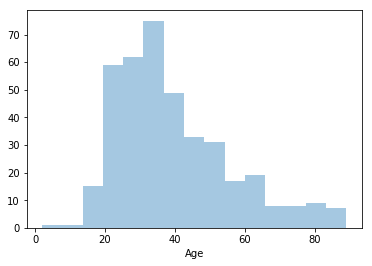

In [16]:
sns.distplot(img_df[img_df.TB_state==1]['Age'], kde=False)

## Part 2: Feature extraction

### Use pretrained ResNet50 for feature extraction
* #### Output of the layer before the final classification layer: shape (1, 2048)

In [17]:
import time
start = time.time()

import numpy as np
from tensorflow.python.keras.applications import ResNet50, InceptionV3, InceptionResNetV2
from tensorflow.python.keras.preprocessing import image
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.applications.resnet50 import preprocess_input
#from tensorflow.python.keras.applications.inception_v3 import preprocess_input
#from tensorflow.python.keras.applications.inception_resnet_v2 import preprocess_input

resnet_weights_path = '../input/keras-pretrained-models/resnet50_weights_tf_dim_ordering_tf_kernels.h5'
#inceptionv3_weights_path = '../input/keras-pretrained-models/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
#inceptionresnetv2_weights_path = '../input/keras-pretrained-models/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5'

base_model = ResNet50(weights=resnet_weights_path)
model = Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)

image_size = 224
img_paths = img_df.Path.tolist()
features_array = np.zeros((800,2048))

for i, img_path in enumerate(img_paths):
    img = image.load_img(img_path, target_size=(image_size, image_size))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x)
    features = features.reshape(2048,)
    features_array[i,:] = features
    
print('Running time: %.4f seconds' % (time.time()-start))

Instructions for updating:
Colocations handled automatically by placer.
Running time: 110.3691 seconds


In [18]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalizationV1) (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [19]:
features_array.shape

(800, 2048)

In [20]:
img_df.head(2)

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
0,CHNCXR_0428_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,39.0,M,secondary PTB in the right upper field
1,CHNCXR_0173_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,28.0,M,normal


In [21]:
df = pd.DataFrame(features_array)
df['Image_name'] = img_df.Image_name
df['TB_state'] = img_df.TB_state
df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047,Image_name,TB_state
0,1.786314,1.066687,0.0,2.091320,0.511319,0.766105,0.033227,0.081668,0.028608,0.129324,0.312365,0.197893,0.097688,0.000000,3.127633,0.041977,0.133403,0.863811,0.039499,0.004647,0.399597,0.870093,0.004160,0.157085,0.076834,0.081318,1.026655,0.04126,0.549084,0.656881,0.435954,0.033511,0.015734,0.001155,1.472885,0.412077,2.048804,0.080114,0.0,0.338409,...,1.434783,0.000000,0.000000,3.355423,0.085757,0.034662,0.294680,0.506094,0.0,0.097053,0.296065,0.008316,0.230780,0.804120,0.012325,0.280476,0.065926,0.148005,0.160081,0.496172,0.225874,0.773026,0.048242,1.632621,0.507436,0.047462,0.862827,0.825008,0.030811,0.355945,1.805609,0.217474,1.398881,3.668994,0.576458,0.004536,0.371799,0.005142,CHNCXR_0428_1.png,1
1,2.732911,1.021521,0.0,1.195392,0.028748,0.376712,0.091269,0.079359,0.000000,0.064027,0.022009,0.415644,0.069891,0.147402,1.504538,0.013212,0.089977,0.183359,0.800892,0.017960,0.130530,0.260976,0.062407,0.161657,0.746382,0.084005,0.851386,0.00000,0.082847,0.793496,0.446483,0.293536,0.000000,0.000000,0.393151,0.025368,0.541295,0.065391,0.0,0.020904,...,0.467233,0.085067,0.053856,2.759864,0.215084,0.049368,0.038873,0.303000,0.0,0.160330,0.443579,0.000000,0.483366,1.664175,0.000000,0.672356,0.064453,0.042781,0.007855,0.007203,0.037744,0.621497,0.074609,1.932518,0.205432,0.191273,0.788422,1.378706,0.002053,0.338421,0.292350,0.002803,0.683181,2.949430,0.218593,0.090417,0.187880,0.177144,CHNCXR_0173_0.png,0


In [22]:
from sklearn.model_selection import train_test_split
X = df.drop(['Image_name', 'TB_state'], axis=1)
y = df.TB_state
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2)

## Part 3: Feed extracted features into SVM for classification

### SVM w/o cross-validation

In [23]:
import time
start = time.time()

from sklearn.svm import SVC
clf = SVC()
clf.fit(Xtrain, ytrain)
preds = clf.predict(Xtest)

print('Running time: %.4f seconds' % (time.time()-start))

/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Running time: 1.1234 seconds


In [24]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print(accuracy_score(ytest, preds))

0.825


#### Confustion matrix

Text(0.5, 1.0, 'Confusion Matrix')

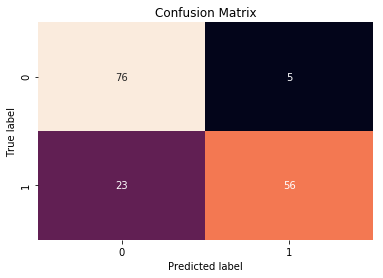

In [25]:
cm = confusion_matrix(ytest, preds)
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

#### Classification report

In [26]:
from sklearn.metrics import classification_report
print(classification_report(ytest, preds))

              precision    recall  f1-score   support

           0       0.77      0.94      0.84        81
           1       0.92      0.71      0.80        79

   micro avg       0.82      0.82      0.82       160
   macro avg       0.84      0.82      0.82       160
weighted avg       0.84      0.82      0.82       160



### SVM with cross-validation

In [27]:
from sklearn.model_selection import GridSearchCV

In [28]:
import time
start = time.time()

from sklearn.metrics import make_scorer
scoring = {'AUC': 'roc_auc', 'Accuracy': make_scorer(accuracy_score)}

clf_cv = GridSearchCV(SVC(), cv=5, param_grid={'C':[1,10,100,1000], 'gamma':[0.0001,0.001,0.01,0.1,1]}, verbose=1,
                      scoring=scoring, refit='AUC', return_train_score=True)
clf_cv.fit(Xtrain, ytrain)

print('Running time: %.4f seconds' % (time.time()-start))

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  3.7min finished


Running time: 221.3245 seconds


In [29]:
best_clf_cv = clf_cv.best_estimator_
best_clf_cv

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [30]:
clf_cv.best_score_

0.9187301587301586

In [31]:
preds_cv = best_clf_cv.predict(Xtest)
print(accuracy_score(ytest, preds_cv))

0.8125


#### Confustion matrix

Text(0.5, 1.0, 'Confusion Matrix')

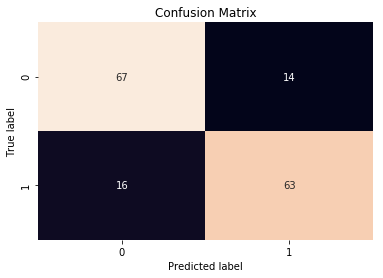

In [32]:
cm = confusion_matrix(ytest, preds_cv)
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

#### Classification report

In [33]:
from sklearn.metrics import classification_report
print(classification_report(ytest, preds_cv))

              precision    recall  f1-score   support

           0       0.81      0.83      0.82        81
           1       0.82      0.80      0.81        79

   micro avg       0.81      0.81      0.81       160
   macro avg       0.81      0.81      0.81       160
weighted avg       0.81      0.81      0.81       160



### If feature vector is L2 normalized to unit length

In [34]:
norms = np.linalg.norm(features_array, axis = 1, keepdims=True)
X_norm = features_array/norms
X_norm.shape

(800, 2048)

In [35]:
Xtrain2, Xtest2, ytrain2, ytest2 = train_test_split(X_norm, y, test_size=0.2)

In [36]:
start = time.time()

from sklearn.metrics import make_scorer
scoring = {'AUC': 'roc_auc', 'Accuracy': make_scorer(accuracy_score)}

clf_cv_norm = GridSearchCV(SVC(), cv=5, param_grid={'C':[1,10,100,1000], 'gamma':[0.0001,0.001,0.01,0.1,1]}, verbose=1,
                      scoring=scoring, refit='AUC', return_train_score=True)
clf_cv_norm.fit(Xtrain2, ytrain2)

print('Running time: %.4f seconds' % (time.time()-start))

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  3.3min finished
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Running time: 197.4959 seconds


In [37]:
best_clf_cv_norm = clf_cv_norm.best_estimator_
best_clf_cv_norm

SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=1, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [38]:
clf_cv_norm.best_score_

0.8926273823832418

In [39]:
preds_cv_norm = best_clf_cv_norm.predict(Xtest2)
print(accuracy_score(ytest2, preds_cv_norm))

0.88125


#### Confustion matrix

Text(0.5, 1.0, 'Confusion Matrix')

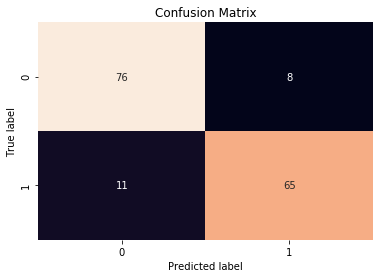

In [40]:
cm = confusion_matrix(ytest2, preds_cv_norm)
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

#### Classification report

In [41]:
from sklearn.metrics import classification_report
print(classification_report(ytest2, preds_cv_norm))

              precision    recall  f1-score   support

           0       0.87      0.90      0.89        84
           1       0.89      0.86      0.87        76

   micro avg       0.88      0.88      0.88       160
   macro avg       0.88      0.88      0.88       160
weighted avg       0.88      0.88      0.88       160

